In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Imports & Functions

In [3]:
%reset -f # Try to reset variables to fix issues
import os
from collections.abc import Sequence
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure, show
from IPython.display import Image
from sklearn import preprocessing, metrics, svm, datasets
from sklearn.metrics import (roc_curve, auc, f1_score, precision_score, recall_score, confusion_matrix, classification_report)
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
import tensorflow as tf
from tensorflow.keras import layers, optimizers, Model, Input
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Dense, Activation, Dropout, Flatten, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, GlobalAveragePooling2D, Embedding, concatenate)
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.applications import MobileNetV2, ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from keras.preprocessing import sequence
from keras.models import Model
!pip install -q -U keras-tuner
from keras_tuner import HyperModel
import cv2
from keras_tuner import RandomSearch

Don't know how to reset  #, please run `%reset?` for details
Don't know how to reset  try, please run `%reset?` for details
Don't know how to reset  to, please run `%reset?` for details
Don't know how to reset  reset, please run `%reset?` for details
Don't know how to reset  variables, please run `%reset?` for details
Don't know how to reset  to, please run `%reset?` for details
Don't know how to reset  fix, please run `%reset?` for details
Don't know how to reset  issues, please run `%reset?` for details


In [ ]:
# Encode text values to dummy variables(i.e. [1,0,0],[0,1,0],[0,0,1] for red,green,blue)
def encode_text_dummy(df, name):
    dummies = pd.get_dummies(df[name])
    for x in dummies.columns:
        dummy_name = "{}-{}".format(name, x)
        df[dummy_name] = dummies[x]
    df.drop(name, axis=1, inplace=True)


# Encode text values to indexes(i.e. [1],[2],[3] for red,green,blue).
def encode_text_index(df, name):
    le = preprocessing.LabelEncoder()
    df[name] = le.fit_transform(df[name])
    return le.classes_


# Encode a numeric column as zscores
def encode_numeric_zscore(df, name, mean=None, sd=None):
    if mean is None:
        mean = df[name].mean()

    if sd is None:
        sd = df[name].std()

    df[name] = (df[name] - mean) / sd


# Convert all missing values in the specified column to the median
def missing_median(df, name):
    med = df[name].median()
    df[name] = df[name].fillna(med)


# Convert all missing values in the specified column to the default
def missing_default(df, name, default_value):
    df[name] = df[name].fillna(default_value)


# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column.
    target_type = df[target].dtypes
    target_type = target_type[0] if isinstance(target_type, Sequence) else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        print('CLASS')
        return df[result].values.astype(np.float32), dummies.values.astype(np.float32)
    else:
        # Regression
        print('REG')
        return df[result].values.astype(np.float32), df[target].values.astype(np.float32)

# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

# Function to plot results
def plot(results):
    fig, ax = plt.subplots(figsize=(10, 6))

    for activation in results['Activation'].unique():
        subset = results[results['Activation'] == activation]
        ax.plot(subset['Neurons'].astype(str), subset['RMSE'], marker='o', label=activation)

    ax.set_title('Model Performance by Activation Function')
    ax.set_xlabel('Layer Configuration (Neurons)')
    ax.set_ylabel('RMSE')
    ax.legend(title='Activation Function')
    plt.xticks(rotation=45)
    plt.grid()
    plt.tight_layout()
    plt.show()

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred, 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.plot(t['pred'].tolist(), label='Prediction', color='orange')
    plt.plot(t['y'].tolist(), label='Expected', color='blue')
    plt.title(f"Fire Detection\nF1: {f1:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}")
    plt.ylabel('Output')
    plt.legend()
    plt.grid(True)
    plt.show()

# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean()) >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)
    return df

# Encode a column to a range between normalized_low and normalized_high
def encode_numeric_range(df, name, normalized_low=-1, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = min(df[name])
        data_high = max(df[name])

    df[name] = ((df[name] - data_low) / (data_high - data_low)) \
               * (normalized_high - normalized_low) + normalized_low

# Plot a confusion matrix
def plot_confusion_matrix(cm, names, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=45)
    plt.yticks(tick_marks, names)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


# Plot an ROC
def plot_roc(pred,y):
    fpr, tpr, thresholds = roc_curve(y, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

# Data Collection
  Images of fire and non-fire scenarios
  
  Derek Chen

In [ ]:
fire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/fire_images/*.jpg"):  # Adjust if needed
    if os.path.isfile(path):
        fire_Images.append(path)

nonFire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/*.jpg"):  # Adjust if needed
    if os.path.isfile(path):
        nonFire_Images.append(path)


# Balancing Dataset
  Making both set of dataset equal sizes
  
  Derek Chen

In [ ]:
min_length = min(len(fire_Images), len(nonFire_Images))
fire_Images = fire_Images[:min_length]
nonFire_Images = nonFire_Images[:min_length]

img = pd.DataFrame({
    'Fire Detected': fire_Images,
    'No Fire Detected': nonFire_Images
})

print(f"Number of fire images: {len(fire_Images)}")
print(f"Number of non-fire images: {len(nonFire_Images)}")

Number of fire images: 904
Number of non-fire images: 904


# Image Loading and Preprocessing
  Convert Image ito arrays for CNN

  Derek Chen

In [ ]:
def load_images(image_paths):
    images = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is None:
            print(f"Warning: Could not load image at {path}")
            continue
        img = cv2.resize(img, (128, 128))  # Resize to CNN input size
        img = img / 255.0  # Normalize pixel values to [0, 1]
        images.append(img)
    return np.array(images)

# Label Creation
  Derek Chen

In [ ]:
fire_images_array = load_images(fire_Images)
non_fire_images_array = load_images(nonFire_Images)

print(f"Number of fire images: {len(fire_Images)}")
print(f"Number of non-fire images: {len(nonFire_Images)}")
print(f"Fire images array shape: {fire_images_array.shape}")
print(f"Non-fire images array shape: {non_fire_images_array.shape}")

fire_labels = np.ones(len(fire_images_array))
non_fire_labels = np.zeros(len(non_fire_images_array))

# Combine data and labels
x = np.concatenate([fire_images_array, non_fire_images_array], axis=0)
y = np.concatenate([fire_labels, non_fire_labels], axis=0)

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

Number of fire images: 904
Number of non-fire images: 904
Fire images array shape: (904, 128, 128, 3)
Non-fire images array shape: (904, 128, 128, 3)
X shape: (1808, 128, 128, 3)
y shape: (1808,)


# Base CNN Train and Test Model
Derek Chen


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

#CNN
cnn_input = Input(shape=(128, 128, 3))
cnn_conv1 = Conv2D(64, kernel_size=4, activation='relu')(cnn_input)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)
cnn_conv2 = Conv2D(32, kernel_size=4, activation='relu')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)
cnn_flat = Flatten()(cnn_pool2)
cnn_output = Dense(1, activation='sigmoid')(cnn_flat)

cnn_model = Model(inputs=cnn_input, outputs=cnn_output)
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
cnn_model.summary()

history = cnn_model.fit(x_train, y_train, validation_split=0.2, epochs=10, batch_size=32, verbose=1)

test_loss, test_accuracy = cnn_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")
y_pred = cnn_model.predict(x_test).flatten()
y_pred_binary = (y_pred > 0.5).astype(int)
from sklearn.metrics import confusion_matrix, classification_report
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_binary))
print("Classification Report:\n", classification_report(y_test, y_pred_binary, target_names=["No Fire", "Fire"]))


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 125, 125, 64)        │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 59, 59, 32)          │          32,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 29, 29, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 26912)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │          26,913 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 62,849 (245.50 KB)

 Trainable params: 62,849 (245.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - accuracy: 0.7326 - loss: 0.4552 - val_accuracy: 0.9724 - val_loss: 0.1102
Epoch 2/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9238 - loss: 0.1824 - val_accuracy: 0.9310 - val_loss: 0.1450
Epoch 3/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9541 - loss: 0.1263 - val_accuracy: 0.9793 - val_loss: 0.0827
Epoch 4/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9597 - loss: 0.1046 - val_accuracy: 0.9414 - val_loss: 0.1423
Epoch 5/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9453 - loss: 0.1423 - val_accuracy: 0.9276 - val_loss: 0.1537
Epoch 6/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9604 - loss: 0.0997 - val_accuracy: 0.9690 - val_loss: 0.0928
Epoch 7/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9555 - loss: 0.1099 - val_accuracy: 0.9310 - val_loss: 0.1674
Epoch 8/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9585 - loss: 0.1192 - val_accuracy: 0.9586 - 

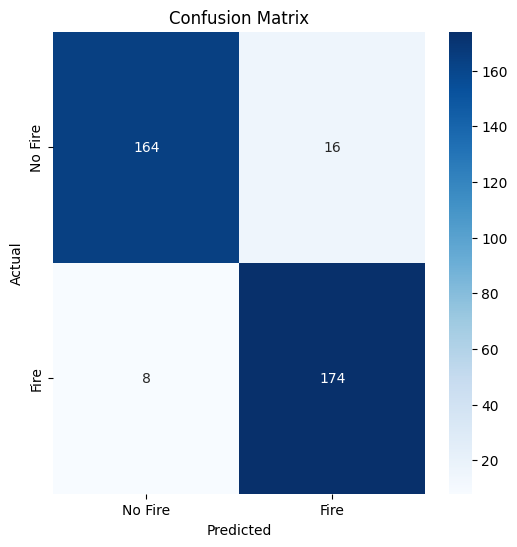

Classification Report:
               precision    recall  f1-score   support

     No Fire       0.95      0.91      0.93       180
        Fire       0.92      0.96      0.94       182

    accuracy                           0.93       362
   macro avg       0.93      0.93      0.93       362
weighted avg       0.93      0.93      0.93       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


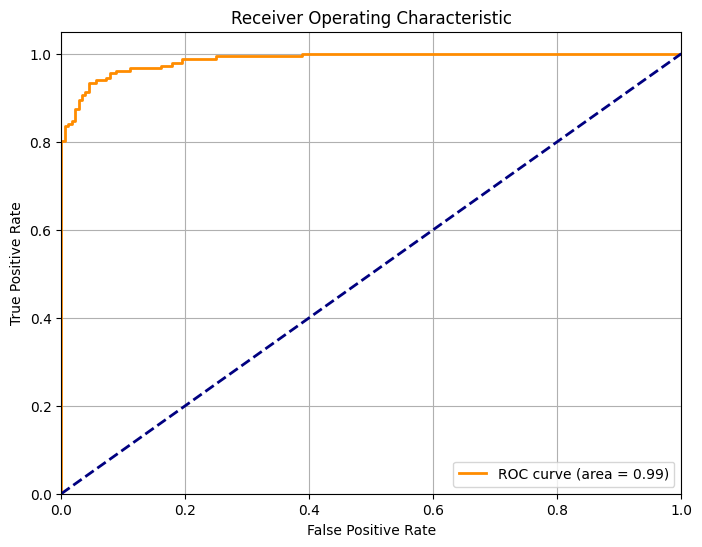

In [ ]:
# Confusion Matrix
class_names = ["No Fire", "Fire"]
plot_confusion_matrix(y_test, y_pred_binary, class_names)

# Classification Report
print("Classification Report:\n", classification_report(y_test, y_pred_binary, target_names=class_names))

# ROC Curve
y_pred_proba = cnn_model.predict(x_test).flatten()  # Predicted probabilities for the positive class
plot_roc(y_test, y_pred_proba)

# Keras Auto Tuner: CNN Model
Nicolas Gugliemo

Link: https://www.youtube.com/watch?v=6Nf1x7qThR8&list=LL&index=2&t=634s&ab_channel=GregHogg

In [ ]:
def build_model(hp):
    cnn_input = Input(shape=(128, 128, 3))

    # Convolutional Layer 1
    cnn_conv1 = Conv2D(
        filters=hp.Int('conv1_filters', min_value=32, max_value=128, step=32),
        kernel_size=hp.Choice('conv1_kernel_size', values=[3, 4, 5]),
        activation='relu'
    )(cnn_input)
    cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)

    # Convolutional Layer 2
    cnn_conv2 = Conv2D(
        filters=hp.Int('conv2_filters', min_value=32, max_value=128, step=32),
        kernel_size=hp.Choice('conv2_kernel_size', values=[3, 4, 5]),
        activation='relu'
    )(cnn_pool1)
    cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)

    # Flatten Layer
    cnn_flat = Flatten()(cnn_pool2)

    # Dense Layer
    cnn_dense = Dense(
        units=hp.Int('dense_units', min_value=64, max_value=256, step=64),
        activation='relu'
    )(cnn_flat)

    # Output Layer
    cnn_output = Dense(1, activation='sigmoid')(cnn_dense)

    # Compile Model
    model = Model(inputs=cnn_input, outputs=cnn_output)
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop']),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    return model


In [ ]:
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,  # Number of models to test
    executions_per_trial=1,  # Average over multiple runs
    directory='modelBest',  # Save search results here
    project_name='fire_detection'
)

Reloading Tuner from modelBest/fire_detection/tuner0.json


In [ ]:
tuner.search(x_train, y_train,
             validation_split=0.2,
             epochs=10,
             batch_size=32,
             verbose=1)

In [ ]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
Best hyperparameters:
- conv1_filters: {best_hps.get('conv1_filters')}
- conv1_kernel_size: {best_hps.get('conv1_kernel_size')}
- conv2_filters: {best_hps.get('conv2_filters')}
- conv2_kernel_size: {best_hps.get('conv2_kernel_size')}
- dense_units: {best_hps.get('dense_units')}
- optimizer: {best_hps.get('optimizer')}
""")


Best hyperparameters:
- conv1_filters: 96
- conv1_kernel_size: 4
- conv2_filters: 96
- conv2_kernel_size: 3
- dense_units: 128
- optimizer: adam



In [ ]:
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(x_train, y_train,
                         validation_split=0.2,
                         epochs=20,
                         batch_size=32,
                         verbose=1)

Epoch 1/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - accuracy: 0.7886 - loss: 0.6596 - val_accuracy: 0.7138 - val_loss: 0.8958
Epoch 2/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.8639 - loss: 0.4001 - val_accuracy: 0.9517 - val_loss: 0.1998
Epoch 3/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.9256 - loss: 0.2360 - val_accuracy: 0.9724 - val_loss: 0.1174
Epoch 4/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.9565 - loss: 0.1319 - val_accuracy: 0.6483 - val_loss: 1.9911
Epoch 5/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.8633 - loss: 0.4694 - val_accuracy: 0.9552 - val_loss: 0.1095
Epoch 6/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9598 - loss: 0.1172 - val_accuracy: 0.9655 - val_loss: 0.0950
Epoch 7/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.9663 - loss: 0.0908 - val_accuracy: 0.9690 - val_loss: 0.0990
Epoch 8/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.9673 - loss: 0.0750 - val_accuracy: 0.9655 - 

In [ ]:
test_loss, test_accuracy = best_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.9433 - loss: 0.3218
Test Accuracy: 0.94


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step


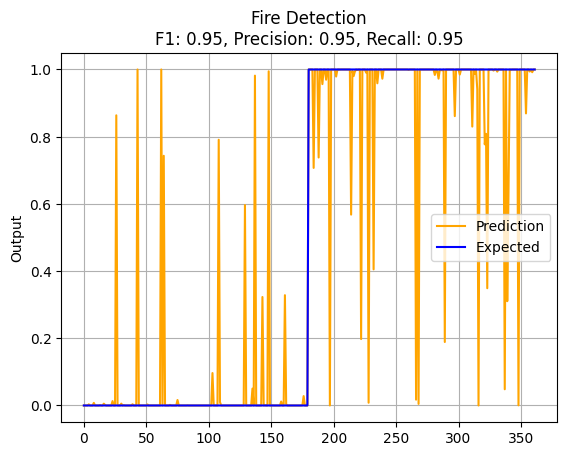

In [ ]:
y_pred = best_model.predict(x_test).flatten()  # Get predicted probabilities
chart_regression(y_pred, y_test)

# Testing other CNN Models
Katrina Yu

In [ ]:
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, classification_report
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# CNN Model
cnn_input = Input(shape=(128, 128, 3))
cnn_conv1 = Conv2D(128, kernel_size=4, activation='relu')(cnn_input)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)
cnn_conv2 = Conv2D(64, kernel_size=4, activation='relu')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)
cnn_flat = Flatten()(cnn_pool2)
cnn_output = Dense(2, activation='softmax')(cnn_flat)

cnn_model = Model(inputs=cnn_input, outputs=cnn_output)
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

cnn_model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with EarlyStopping callback
history = cnn_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[early_stopping])

# Evaluate the model
test_loss, test_accuracy = cnn_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Predict and evaluate
y_pred = cnn_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices

# Convert y_test back to class labels
y_test_labels = y_test.argmax(axis=1)

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 125, 125, 128)       │           6,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 62, 62, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 59, 59, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 29, 29, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 53824)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 2)                   │         107,650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 245,058 (957.26 KB)

 Trainable params: 245,058 (957.26 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - accuracy: 0.7727 - loss: 0.5843 - val_accuracy: 0.9103 - val_loss: 0.2391
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9261 - loss: 0.1917 - val_accuracy: 0.8552 - val_loss: 0.3335
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.9273 - loss: 0.1795 - val_accuracy: 0.9379 - val_loss: 0.1410
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9532 - loss: 0.1431 - val_accuracy: 0.9448 - val_loss: 0.1449
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9390 - loss: 0.2171 - val_accuracy: 0.9655 - val_loss: 0.1528
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.9496 - loss: 0.1547 - val_accuracy: 0.9621 - val_loss: 0.1236
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.9563 - loss: 0.1318 - val_accuracy: 0.9655 - val_loss: 0.1517
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9436 - loss: 0.1504 - val_accuracy: 0

Confusion Matrix:
 [[173   7]
 [ 12 170]]
Classification Report:
               precision    recall  f1-score   support

     No Fire       0.94      0.96      0.95       180
        Fire       0.96      0.93      0.95       182

    accuracy                           0.95       362
   macro avg       0.95      0.95      0.95       362
weighted avg       0.95      0.95      0.95       362



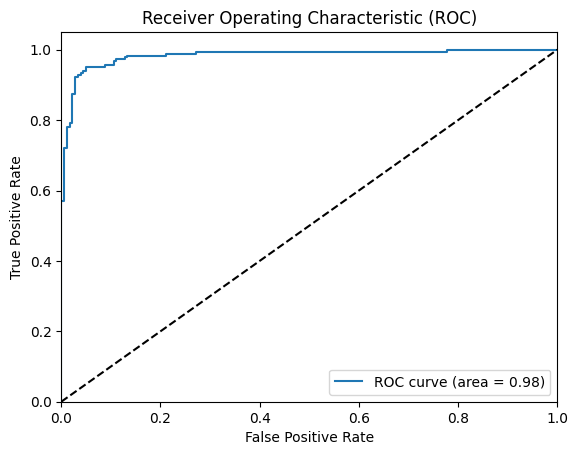

In [ ]:
print("Confusion Matrix:\n", confusion_matrix(y_test_labels, y_pred_binary))
print("Classification Report:\n", classification_report(y_test_labels, y_pred_binary, target_names=["No Fire", "Fire"]))

# ROC Curve
y_pred_proba = y_pred[:,1]  # Predicted probabilities for the positive class
plot_roc(y_pred_proba, y_test_labels)

# VGG16 Transfer Learning Model
Katrina Yu

In [ ]:
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Train img with VGG16
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))   #  first hidden layer

# Freezing the layers
for layer in vgg.layers:
    layer.trainable = False

vgg16 = vgg.output
cnn_conv1 = Conv2D(2, kernel_size=3, activation='relu', padding='same')(vgg16)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)
dropout = Dropout(.5)(cnn_pool1)
cnn_flat = Flatten()(dropout)
output = Dense(2, activation='softmax')(cnn_flat)

vgg16_model = Model(inputs=vgg.input, outputs=output)
vgg16_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

vgg16_model.summary()

monitor = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

vgg16_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[monitor])


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 4, 4, 2)             │           9,218 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 2, 2, 2)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 14,723,924 (56.17 MB)

 Trainable params: 9,236 (36.08 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 30s 337ms/step - accuracy: 0.5725 - loss: 0.7081 - val_accuracy: 0.9000 - val_loss: 0.4133
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.7956 - loss: 0.4583 - val_accuracy: 0.9379 - val_loss: 0.2819
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.8212 - loss: 0.3968 - val_accuracy: 0.9552 - val_loss: 0.2206
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.8557 - loss: 0.3286 - val_accuracy: 0.9690 - val_loss: 0.1555
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.8700 - loss: 0.2800 - val_accuracy: 0.9759 - val_loss: 0.1386
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.9106 - loss: 0.2490 - val_accuracy: 0.9862 - val_loss: 0.1205
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.8898 - loss: 0.2366 - val_accuracy: 0.9759 - val_loss: 0.1018
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9118 - loss: 0.1955 - val_accuracy:

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step
Confusion Matrix:
[[178   2]
 [  5 177]]


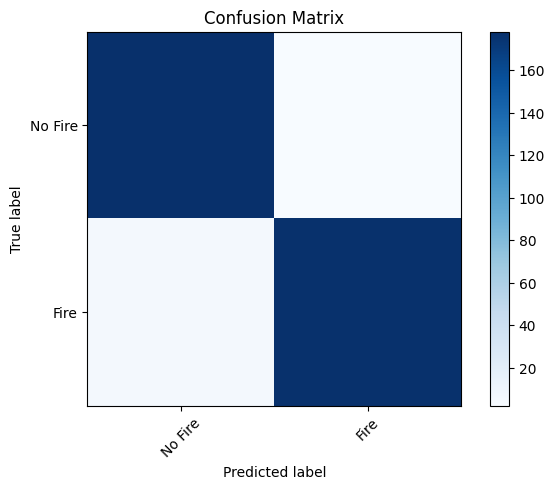

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       180
           1       0.99      0.97      0.98       182

    accuracy                           0.98       362
   macro avg       0.98      0.98      0.98       362
weighted avg       0.98      0.98      0.98       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


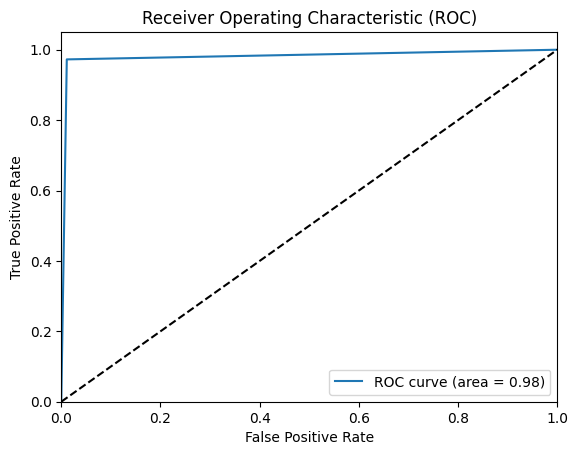

F1 Score: 0.9806094182825484
Precision: 0.9888268156424581
Recall: 0.9725274725274725


In [ ]:
y_pred = vgg16_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices
y_test_labels = y_test.argmax(axis=1)  # Convert to class indices

f1 = f1_score(y_test_labels, y_pred_binary)
precision = precision_score(y_test_labels, y_pred_binary)
recall = recall_score(y_test_labels, y_pred_binary)

# Compute confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
class_names = ['No Fire', 'Fire']  # Replace with actual class names
plt.figure()
plot_confusion_matrix(cm, class_names, title='Confusion Matrix')
plt.show()
print(classification_report(y_test_labels, y_pred_binary))

y_true = np.argmax(y_test, axis=1)
pred = vgg16_model.predict(x_test)
pred = pred[:, 1]
plot_roc(y_pred_binary, y_test_labels)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

# Keras Auto Tuner: VGG16 Transfer Model
Nicolas Gugliemo TO-DO (Not sure if a already trained model can be hyper tunned)

# ResNet50 Transfer Learning Model
Xai Yang

### Testing 1

In [ ]:
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# load model with pretrained weights
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# freeze the model
for layer in resnet.layers:
    layer.trainable = False

In [ ]:
resnet50 = resnet.output

cnn_conv1 = Conv2D(2, kernel_size=3, activation='relu', padding='same')(resnet50)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)

cnn_conv2 = Conv2D(1, kernel_size=3, activation='relu', padding='same')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)


dropout = Dropout(.5)(cnn_pool2)
cnn_flat = Flatten()(dropout)
output = Dense(2, activation='softmax')(cnn_flat)

resnet50_model = Model(inputs=resnet.input, outputs=output)
resnet50_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

resnet50_model.summary()

monitor = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

resnet50_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[monitor])


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 134, 134, 3)    │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 64, 64, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 64, 64, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 64, 64, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 66, 66, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 32, 32, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 32, 32, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 32, 32, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 32, 32, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 32, 32, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,624,601 (90.12 MB)

 Trainable params: 36,889 (144.10 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.5121 - loss: 0.6952 - val_accuracy: 0.5207 - val_loss: 0.6904
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.5517 - loss: 0.6903 - val_accuracy: 0.7621 - val_loss: 0.6867
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.5579 - loss: 0.6879 - val_accuracy: 0.7483 - val_loss: 0.6822
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.5799 - loss: 0.6796 - val_accuracy: 0.6690 - val_loss: 0.6677
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.5840 - loss: 0.6674 - val_accuracy: 0.7897 - val_loss: 0.6539
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.6124 - loss: 0.6575 - val_accuracy: 0.7517 - val_loss: 0.6328
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.6103 - loss: 0.6472 - val_accuracy: 0.7897 - val_loss: 0.6215
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.6501 - loss: 0.6426 - val_accuracy: 0.8034 - v

In [ ]:
# Evaluate the model
test_loss, test_accuracy = resnet50_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.8940 - loss: 0.4161
Test Accuracy: 0.90


12/12 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step
Confusion Matrix:
[[159  21]
 [ 17 165]]


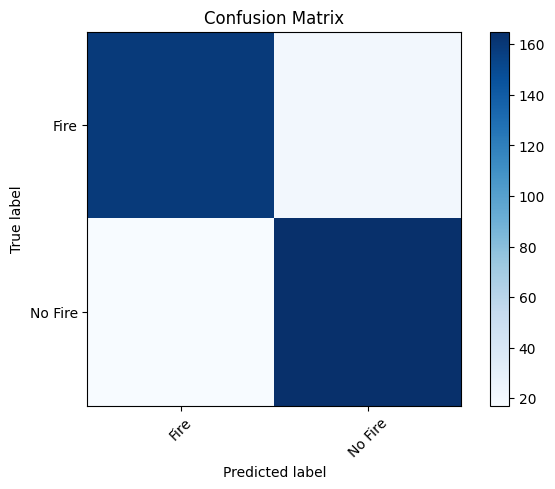

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       180
           1       0.89      0.91      0.90       182

    accuracy                           0.90       362
   macro avg       0.90      0.89      0.89       362
weighted avg       0.90      0.90      0.90       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step


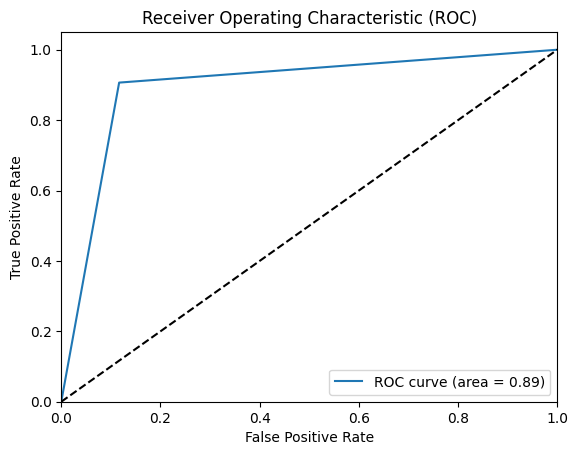

F1 Score: 0.8967391304347826
Precision: 0.8870967741935484
Recall: 0.9065934065934066


In [ ]:
y_pred = resnet50_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices
y_test_labels = y_test.argmax(axis=1)  # Convert to class indices

f1 = f1_score(y_test_labels, y_pred_binary)
precision = precision_score(y_test_labels, y_pred_binary)
recall = recall_score(y_test_labels, y_pred_binary)

# Compute confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
class_names = ['Fire', 'No Fire']
plt.figure()
plot_confusion_matrix(cm, class_names, title='Confusion Matrix')
plt.show()
print(classification_report(y_test_labels, y_pred_binary))

y_true = np.argmax(y_test, axis=1)
pred = resnet.predict(x_test)
pred = pred[:, 1]
plot_roc(y_pred_binary, y_test_labels)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

### Testing 2

In [ ]:
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# load model with pretrained weights
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# freeze the model
for layer in resnet.layers:
    layer.trainable = False

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
resnet50 = resnet.output

cnn_conv1 = Conv2D(64, kernel_size=3, activation='relu', padding='same')(resnet50)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)

cnn_conv2 = Conv2D(32, kernel_size=3, activation='relu', padding='same')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)


dropout = Dropout(.5)(cnn_pool2)
cnn_flat = Flatten()(dropout)
output = Dense(2, activation='softmax')(cnn_flat)

resnet50_model = Model(inputs=resnet.input, outputs=output)
resnet50_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

resnet50_model.summary()

monitor = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

resnet50_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[monitor])


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 134, 134, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 64, 64, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 64, 64, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 64, 64, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 66, 66, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 32, 32, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 32, 32, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 32, 32, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 32, 32, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 32, 32, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 32, 32, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 24,785,954 (94.55 MB)

 Trainable params: 1,198,242 (4.57 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - accuracy: 0.5071 - loss: 0.7956 - val_accuracy: 0.7448 - val_loss: 0.6346
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.6508 - loss: 0.6198 - val_accuracy: 0.8862 - val_loss: 0.4989
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.7642 - loss: 0.5146 - val_accuracy: 0.7138 - val_loss: 0.5084
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.7838 - loss: 0.4634 - val_accuracy: 0.9034 - val_loss: 0.3233
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.8610 - loss: 0.3598 - val_accuracy: 0.8759 - val_loss: 0.2773
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.8323 - loss: 0.3874 - val_accuracy: 0.9138 - val_loss: 0.2966
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.8612 - loss: 0.3535 - val_accuracy: 0.9103 - val_loss: 0.2508
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.8891 - loss: 0.2898 - val_accuracy: 0.91

In [ ]:
# Evaluate the model
test_loss, test_accuracy = resnet50_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9291 - loss: 0.1839
Test Accuracy: 0.92


12/12 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step
Confusion Matrix:
[[167  13]
 [ 16 166]]


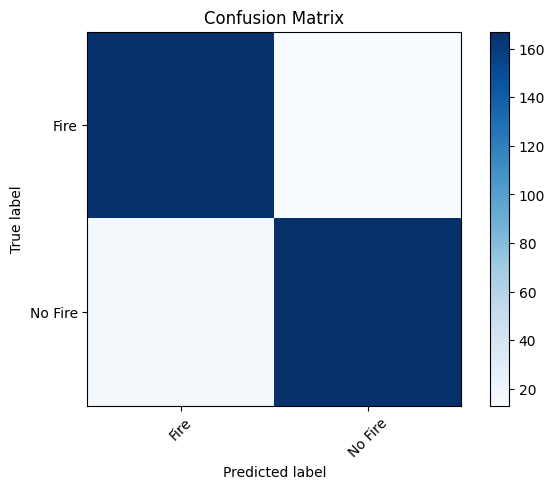

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       180
           1       0.93      0.91      0.92       182

    accuracy                           0.92       362
   macro avg       0.92      0.92      0.92       362
weighted avg       0.92      0.92      0.92       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step


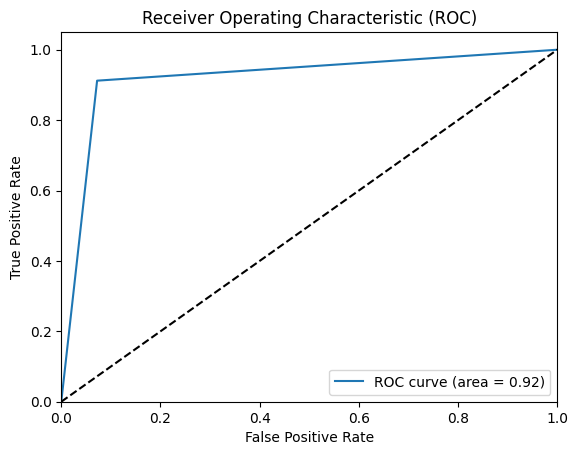

F1 Score: 0.9196675900277008
Precision: 0.9273743016759777
Recall: 0.9120879120879121


In [ ]:
y_pred = resnet50_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices
y_test_labels = y_test.argmax(axis=1)  # Convert to class indices

f1 = f1_score(y_test_labels, y_pred_binary)
precision = precision_score(y_test_labels, y_pred_binary)
recall = recall_score(y_test_labels, y_pred_binary)

# Compute confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
class_names = ['Fire', 'No Fire']
plt.figure()
plot_confusion_matrix(cm, class_names, title='Confusion Matrix')
plt.show()
print(classification_report(y_test_labels, y_pred_binary))

y_true = np.argmax(y_test, axis=1)
pred = resnet.predict(x_test)
pred = pred[:, 1]
plot_roc(y_pred_binary, y_test_labels)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

# MobileNetV2 Transfer Learning Model
Xai Yang

### Testing 1

In [ ]:
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# load model with pretrained weights
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# freeze the model
for layer in mobilenet.layers:
    layer.trainable = False

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
mobilenetv2 = mobilenet.output

cnn_conv1 = Conv2D(64, kernel_size=3, activation='relu', padding='same')(mobilenetv2)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)
cnn_conv2 = Conv2D(32, kernel_size=3, activation='relu', padding='same')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)

dropout = Dropout(.5)(cnn_pool2)
cnn_flat = Flatten()(dropout)
output = Dense(2, activation='softmax')(cnn_flat)

mobilenetv2_model = Model(inputs=mobilenet.input, outputs=output)
mobilenetv2_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

mobilenetv2_model.summary()

monitor = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

mobilenetv2_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[monitor])


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 64, 64, 32)     │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 64, 64, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 64, 64, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 64, 64, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 64, 64, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 64, 64, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 64, 64, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 64, 64, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 64, 64, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 65, 65, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 32, 32, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 3,013,858 (11.50 MB)

 Trainable params: 755,874 (2.88 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 32s 672ms/step - accuracy: 0.7681 - loss: 0.6691 - val_accuracy: 0.9759 - val_loss: 0.0734
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 38s 604ms/step - accuracy: 0.9690 - loss: 0.0633 - val_accuracy: 0.9759 - val_loss: 0.1187
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 22s 603ms/step - accuracy: 0.9780 - loss: 0.0550 - val_accuracy: 0.9690 - val_loss: 0.1449
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 42s 629ms/step - accuracy: 0.9877 - loss: 0.0406 - val_accuracy: 0.9655 - val_loss: 0.1309
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 20s 555ms/step - accuracy: 0.9849 - loss: 0.0510 - val_accuracy: 0.9655 - val_loss: 0.1427
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 22s 610ms/step - accuracy: 0.9850 - loss: 0.0383 - val_accuracy: 0.9793 - val_loss: 0.1169
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 42s 628ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.9828 - val_loss: 0.1378
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 38s 557ms/step - accuracy: 1.0000 - loss: 0.0025 - 

In [ ]:
# Evaluate the model
test_loss, test_accuracy = mobilenetv2_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 581ms/step - accuracy: 0.9909 - loss: 0.0354
Test Accuracy: 0.98


12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 646ms/step
Confusion Matrix:
[[176   4]
 [  2 180]]


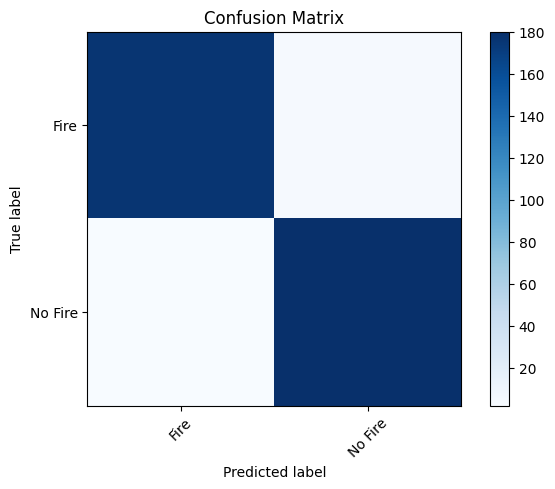

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       180
           1       0.98      0.99      0.98       182

    accuracy                           0.98       362
   macro avg       0.98      0.98      0.98       362
weighted avg       0.98      0.98      0.98       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 445ms/step


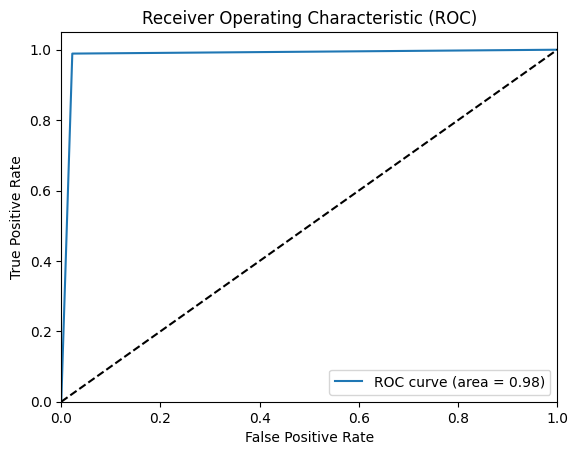

F1 Score: 0.9836065573770492
Precision: 0.9782608695652174
Recall: 0.989010989010989


In [ ]:
y_pred = mobilenetv2_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices
y_test_labels = y_test.argmax(axis=1)  # Convert to class indices

f1 = f1_score(y_test_labels, y_pred_binary)
precision = precision_score(y_test_labels, y_pred_binary)
recall = recall_score(y_test_labels, y_pred_binary)

# Compute confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
class_names = ['Fire', 'No Fire']
plt.figure()
plot_confusion_matrix(cm, class_names, title='Confusion Matrix')
plt.show()
print(classification_report(y_test_labels, y_pred_binary))

y_true = np.argmax(y_test, axis=1)
pred = mobilenet.predict(x_test)
pred = pred[:, 1]
plot_roc(y_pred_binary, y_test_labels)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

### Testing 2

In [ ]:
# Split data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# One-hot encode the labels
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# load model with pretrained weights
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# freeze the model
for layer in mobilenet.layers:
    layer.trainable = False

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
mobilenetv2 = mobilenet.output

cnn_conv1 = Conv2D(128, kernel_size=3, activation='relu', padding='same')(mobilenetv2)
cnn_pool1 = MaxPooling2D(pool_size=(2, 2))(cnn_conv1)

cnn_conv2 = Conv2D(64, kernel_size=3, activation='relu', padding='same')(cnn_pool1)
cnn_pool2 = MaxPooling2D(pool_size=(2, 2))(cnn_conv2)

dropout = Dropout(.5)(cnn_pool2)
cnn_flat = Flatten()(dropout)
output = Dense(2, activation='softmax')(cnn_flat)

mobilenetv2_model = Model(inputs=mobilenet.input, outputs=output)
mobilenetv2_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

mobilenetv2_model.summary()

monitor = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

mobilenetv2_model.fit(x_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[monitor])


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 64, 64, 32)     │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 64, 64, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 64, 64, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 64, 64, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 64, 64, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 64, 64, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 64, 64, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 64, 64, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 64, 64, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 65, 65, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 32, 32, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 3,806,594 (14.52 MB)

 Trainable params: 1,548,610 (5.91 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 31s 639ms/step - accuracy: 0.7734 - loss: 1.0484 - val_accuracy: 0.9655 - val_loss: 0.1291
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 41s 644ms/step - accuracy: 0.9703 - loss: 0.0883 - val_accuracy: 0.9655 - val_loss: 0.0898
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 42s 690ms/step - accuracy: 0.9955 - loss: 0.0206 - val_accuracy: 0.9690 - val_loss: 0.1327
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 37s 586ms/step - accuracy: 0.9855 - loss: 0.0345 - val_accuracy: 0.9793 - val_loss: 0.0974
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 42s 623ms/step - accuracy: 0.9938 - loss: 0.0153 - val_accuracy: 0.9724 - val_loss: 0.1248
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 39s 572ms/step - accuracy: 0.9997 - loss: 0.0059 - val_accuracy: 0.9793 - val_loss: 0.1209
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 23s 624ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.9724 - val_loss: 0.1240
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 40s 609ms/step - accuracy: 1.0000 - loss: 0.0016 - 

In [ ]:
# Evaluate the model
test_loss, test_accuracy = mobilenetv2_model.evaluate(x_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 545ms/step - accuracy: 0.9733 - loss: 0.0512
Test Accuracy: 0.98


12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 664ms/step
Confusion Matrix:
[[171   9]
 [  0 182]]


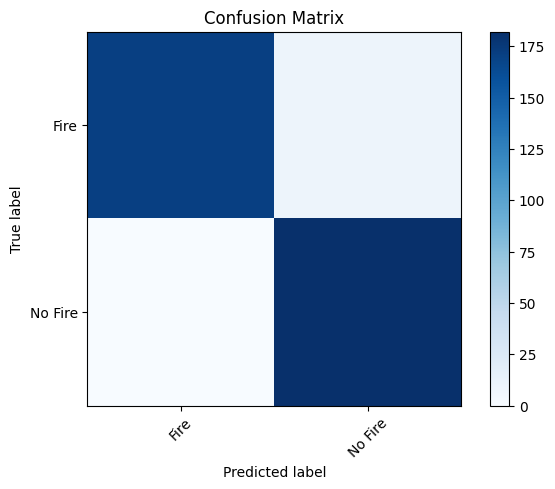

              precision    recall  f1-score   support

           0       1.00      0.95      0.97       180
           1       0.95      1.00      0.98       182

    accuracy                           0.98       362
   macro avg       0.98      0.97      0.98       362
weighted avg       0.98      0.98      0.98       362

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 426ms/step


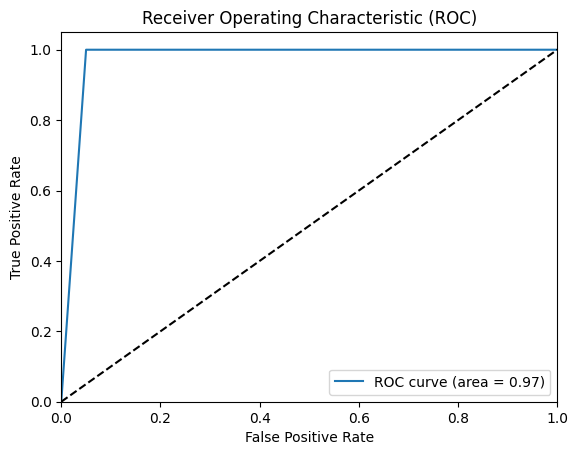

F1 Score: 0.9758713136729222
Precision: 0.9528795811518325
Recall: 1.0


In [ ]:
y_pred = mobilenetv2_model.predict(x_test)
y_pred_binary = y_pred.argmax(axis=1)  # Convert to class indices
y_test_labels = y_test.argmax(axis=1)  # Convert to class indices

f1 = f1_score(y_test_labels, y_pred_binary)
precision = precision_score(y_test_labels, y_pred_binary)
recall = recall_score(y_test_labels, y_pred_binary)

# Compute confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
class_names = ['Fire', 'No Fire']
plt.figure()
plot_confusion_matrix(cm, class_names, title='Confusion Matrix')
plt.show()
print(classification_report(y_test_labels, y_pred_binary))

y_true = np.argmax(y_test, axis=1)
pred = mobilenet.predict(x_test)
pred = pred[:, 1]
plot_roc(y_pred_binary, y_test_labels)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

# Vision Transformer Model (ViT)
Katrina Yu

In [ ]:
!pip install vit-keras
!pip install tensorflow_addons
!pip install tensorflow==2.15.0
!pip install tensorflow-addons==0.21.0

from vit_keras import vit, utils

  Using cached tensorflow_addons-0.21.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.8 kB)
Using cached tensorflow_addons-0.21.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (612 kB)
  Attempting uninstall: tensorflow-addons
    Found existing installation: tensorflow-addons 0.23.0
    Uninstalling tensorflow-addons-0.23.0:
      Successfully uninstalled tensorflow-addons-0.23.0


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.15.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

In [ ]:
image_size = 128

# Load ViT model
vit_model = vit.vit_b16(
    image_size=image_size,
    activation='sigmoid',
    pretrained=True,
    include_top=True,
    pretrained_top=True,
    classes=21843
)

model = vit_model.output

# Load images
fire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/fire_images/*.jpg"):  # Adjust if needed
    if os.path.isfile(path):
        fire_Images.append(path)

nonFire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/*.jpg"):  # Adjust if needed
    if os.path.isfile(path):
        nonFire_Images.append(path)

min_length = min(len(fire_Images), len(nonFire_Images))
fire_Images = fire_Images[:min_length]
nonFire_Images = nonFire_Images[:min_length]

img = pd.DataFrame(fire_Images,nonFire_Images)

def load_images(image_paths):
  images = []
  img_names = []
  for path in image_paths:
      img = cv2.imread(path)
      if img is None:
          print(f"Warning: Could not load image at {path}")
          continue
      img = cv2.resize(img, (128, 128))
      img = img / 255.0  # Normalize pixels
      images.append(img)
      img_names.append(path)
  return np.array(images), img_names

# Load image array and file names
x1, img_names = load_images(fire_Images)

x1 = x1.reshape(len(x1), image_size, image_size, 3)

fire_labels = np.ones(len(x1))
non_fire_labels = np.zeros(len(x1))

model = Model(inputs=vit_model.input, outputs=model)

# Freezing ViT layers
for layer in vit_model.layers:
    layer.trainable = False

preds = model.predict(x1)

results = []
for i, pred in enumerate(preds):
  pred_class = classes[np.argmax(pred)]
  results.append({"filename": img_names[i], "predicted_class": pred_class})

print(results)

/usr/local/lib/python3.10/dist-packages/vit_keras/utils.py:81: UserWarning: Resizing position embeddings from 24, 24 to 8, 8
  warnings.warn(


29/29 [==============================] - 244s 8s/step
[{'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg', 'predicted_class': 'window screen'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg', 'predicted_class': 'oscilloscope, scope, cathode-ray oscilloscope, CRO'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg', 'predicted_class': 'strainer'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg', 'predicted_class': 'spotlight, spot'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc027.jpg', 'predicted_class': 'theater curtain, theatre curtain'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0027.jpg', 'predicted_class': 'digital clock'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0003.jpg', 'predicted_class': 'projector'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/

1/1 [==============================] - 7s 7s/step
/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg', 'predicted_class': 'window screen'}
1/1 [==============================] - 7s 7s/step
/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg', 'predicted_class': 'oscilloscope, scope, cathode-ray oscilloscope, CRO'}
1/1 [==============================] - 8s 8s/step
/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg', 'predicted_class': 'strainer'}
1/1 [==============================] - 4s 4s/step
/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg', 'predicted_class': 'spotlight, spot'}
1/1 [=========================

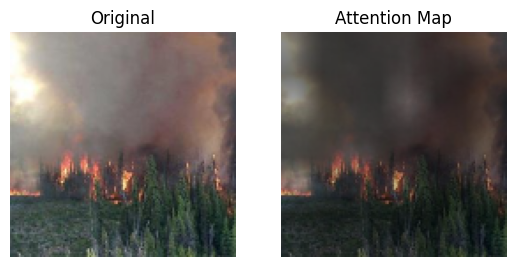

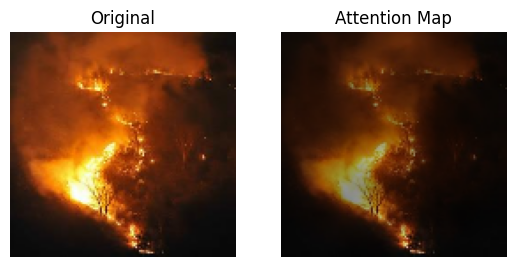

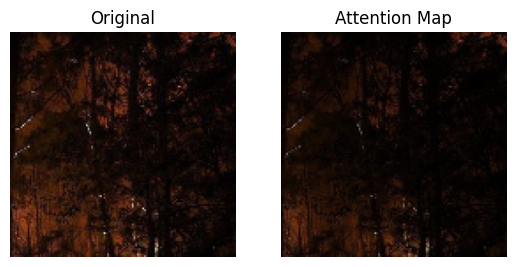

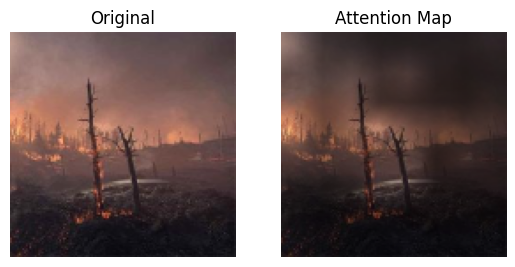

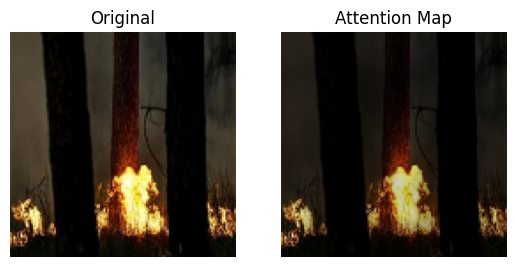

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from vit_keras import vit, utils, visualize

# Plot results
for i in range(5):
  image = utils.read(img_names[i], image_size)
  attention_map = visualize.attention_map(model=model, image=image)

  fig, (ax1, ax2) = plt.subplots(ncols=2)
  ax1.axis('off')
  ax2.axis('off')
  ax1.set_title('Original')
  ax2.set_title('Attention Map')
  _ = ax1.imshow(image)
  _ = ax2.imshow(attention_map)
  print(img_names[i], results[i])

# ViT Keras 21k Dataset
Katrina Yu

In [ ]:
!pip install opencv-python-headless

import os
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from vit_keras import vit
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
image_size = 128

# Load Vision Transformer (ViT) with ImageNet-21k pretrained weights
vit_model = vit.vit_b16(
    image_size=image_size,
    activation='sigmoid',
    pretrained=True,
    include_top=True,
    pretrained_top=True,
    classes=21843  # classes in ImageNet-21k
)

# Add layers to fit data
x = vit_model.output
x = Dense(1024, activation='relu')(x)
x = Dense(1, activation='sigmoid')(x)
model = Model(inputs=vit_model.input, outputs=x)

# Load image paths for fire and non-fire categories
fire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/fire_images/*.jpg"):
    if os.path.isfile(path):
        fire_Images.append(path)

nonFire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/*.jpg"):
    if os.path.isfile(path):
        nonFire_Images.append(path)

min_length = min(len(fire_Images), len(nonFire_Images))
fire_Images = fire_Images[:min_length]
nonFire_Images = nonFire_Images[:min_length]

# Add images into a DataFrame
img = pd.DataFrame({'fire': fire_Images, 'non_fire': nonFire_Images})

def load_images(image_paths):
    images = []
    img_names = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is None:
            print(f"Warning: Could not load image at {path}")
            continue
        img = cv2.resize(img, (image_size, image_size))
        img = img / 255.0  # Normalize pixels
        images.append(img)
        img_names.append(path)
    return np.array(images), img_names

x1, img_names = load_images(fire_Images)

# vit needs (batch_size, height, width, channels)
x1 = x1.reshape(len(x1), image_size, image_size, 3)

fire_labels = np.ones(len(x1))
non_fire_labels = np.zeros(len(x1))

x_train = np.concatenate([x1, load_images(nonFire_Images)[0]], axis=0)
y_train = np.concatenate([fire_labels, non_fire_labels], axis=0)

# Freeze the ViT model layers
for layer in vit_model.layers:
    layer.trainable = False

model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[EarlyStopping(patience=3, restore_best_weights=True)])

# Unfreeze some layers of the ViT model and fine-tune
for layer in vit_model.layers[-10:]:  # Unfreeze the last 10 layers of the ViT model
    layer.trainable = True

# compiler with lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy',metrics=['accuracy'])
history_fine_tune = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[EarlyStopping(patience=3, restore_best_weights=True)])

# Save the model to a file
model.save('fine_tuned_vit_fire_model.h5')
print("Fine-tuning finished.")

Epoch 1/10
46/46 [==============================] - 540s 11s/step - loss: 0.5250 - accuracy: 0.7275 - val_loss: 0.7782 - val_accuracy: 0.4475
Epoch 2/10
46/46 [==============================] - 573s 12s/step - loss: 0.3756 - accuracy: 0.8610 - val_loss: 0.3499 - val_accuracy: 0.8978
Epoch 3/10
46/46 [==============================] - 565s 12s/step - loss: 0.3085 - accuracy: 0.8935 - val_loss: 0.2611 - val_accuracy: 0.9309
Epoch 4/10
46/46 [==============================] - 519s 11s/step - loss: 0.2618 - accuracy: 0.9136 - val_loss: 0.3441 - val_accuracy: 0.8619
Epoch 5/10
46/46 [==============================] - 563s 12s/step - loss: 0.2307 - accuracy: 0.9246 - val_loss: 0.3063 - val_accuracy: 0.8895
Epoch 6/10
46/46 [==============================] - 564s 12s/step - loss: 0.2114 - accuracy: 0.9253 - val_loss: 0.1621 - val_accuracy: 0.9696
Epoch 7/10
46/46 [==============================] - 519s 11s/step - loss: 0.1918 - accuracy: 0.9405 - val_loss: 0.1994 - val_accuracy: 0.9337
Epoch 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fine-tuning finished.


In [ ]:
preds = model.predict(x1)

results = []
for i, pred in enumerate(preds):
    predicted_class = "fire" if pred >= 0.5 else "non-fire"
    results.append({"filename": img_names[i], "predicted_class": predicted_class})

print(results)

29/29 [==============================] - 280s 9s/step
[{'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc027.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0027.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0003.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc165.jpg', 'predicted_class': 'fire'}, {'filename': '/content/drive/MyDrive/Forest_Fire_BigData/fi

1/1 [==============================] - 2s 2s/step
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/nofire_0699.jpg
Prediction: 0.0000 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/nofire_0482.jpg
Prediction: 0.0006 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/nofire_0612.jpg
Prediction: 0.0000 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/nofire_0581.jpg
Prediction: 0.0002 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/nofire_0623.jpg
Prediction: 0.0001 (1 = Fire, 0 = Non-Fire)


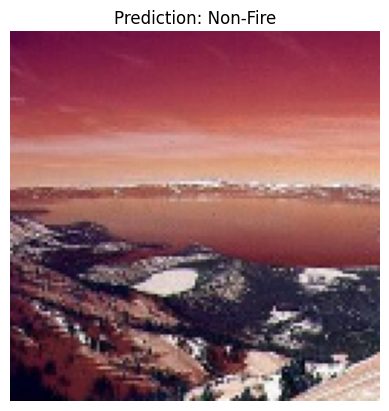

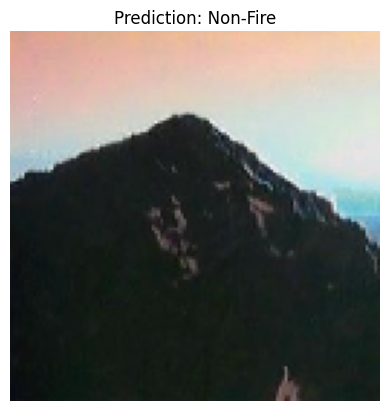

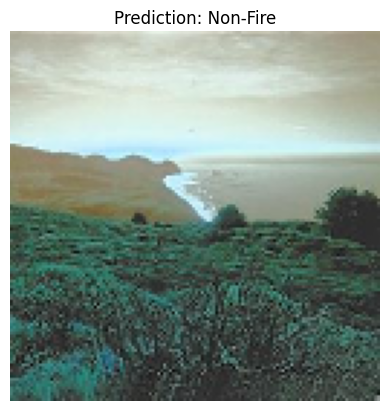

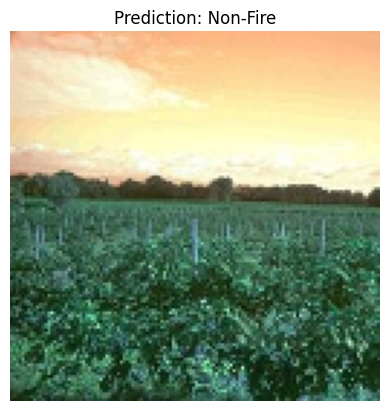

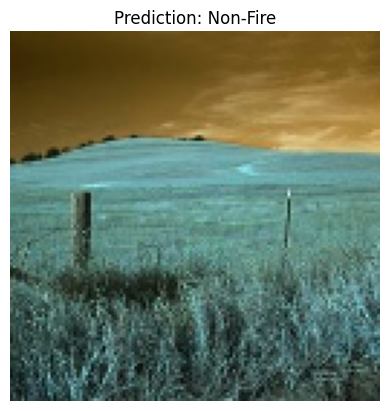

In [ ]:
sample_images, sample_paths = load_images(nonFire_Images[700:705])
preds = model.predict(sample_images)


for i, pred in enumerate(preds):
    print(f"Image: {sample_paths[i]}")
    print(f"Prediction: {pred[0]:.4f} (1 = Fire, 0 = Non-Fire)")

# Showing the image
for i, img in enumerate(sample_images):
    plt.imshow(img)
    plt.title(f"Prediction: {'Fire' if preds[i][0] > 0.5 else 'Non-Fire'}")
    plt.axis('off')
    plt.show()



1/1 [==============================] - 3s 3s/step
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0168.jpg
Prediction: 0.9884 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0162.jpg
Prediction: 0.9994 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0115.jpg
Prediction: 0.9993 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0553.jpg
Prediction: 0.9997 (1 = Fire, 0 = Non-Fire)
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0854.jpg
Prediction: 0.9998 (1 = Fire, 0 = Non-Fire)


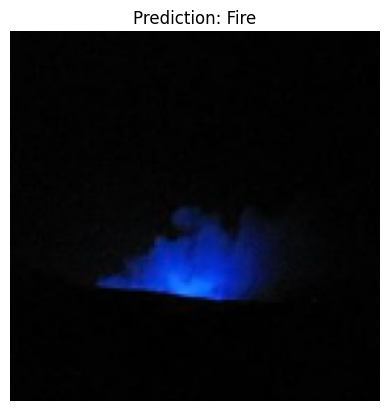

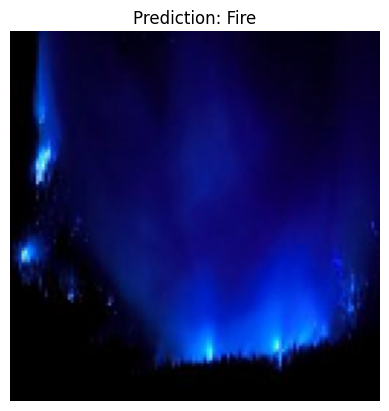

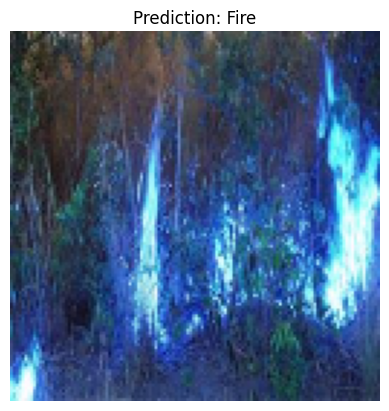

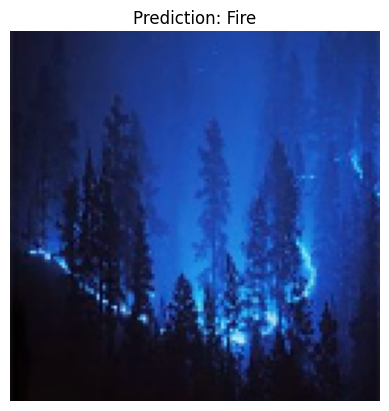

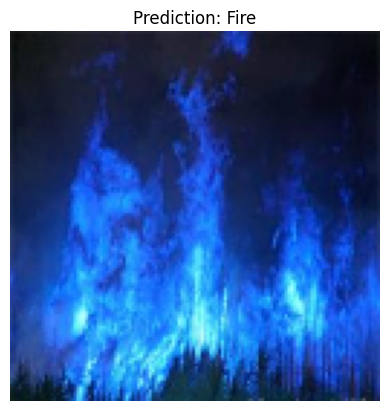

In [ ]:
sample_images, sample_paths = load_images(fire_Images[700:705])  # Use the first 5 images for testing
preds = model.predict(sample_images)

for i, pred in enumerate(preds):
    print(f"Image: {sample_paths[i]}")
    print(f"Prediction: {pred[0]:.4f} (1 = Fire, 0 = Non-Fire)")

# Display images with predictions
for i, img in enumerate(sample_images):
    plt.imshow(img)
    plt.title(f"Prediction: {'Fire' if preds[i][0] > 0.5 else 'Non-Fire'}")
    plt.axis('off')
    plt.show()



# Using Retrained ViT Model:
Katrina Yu

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from vit_keras.layers import ClassToken, AddPositionEmbs
from vit_keras import vit

In [ ]:
image_size = 128

model_path = "/content/drive/MyDrive/Forest_Fire_BigData/fine_tuned_vit_fire_model.h5"
model = load_model(
    model_path,
    custom_objects={
        "ClassToken": ClassToken,
        "AddPositionEmbs": AddPositionEmbs,
        "ViT": vit,  # using vit model
    }
)

fire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/fire_images/*.jpg"):
    if os.path.isfile(path):
        fire_Images.append(path)

nonFire_Images = []
for path in glob.glob("/content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/*.jpg"):
    if os.path.isfile(path):
        nonFire_Images.append(path)

min_length = min(len(fire_Images), len(nonFire_Images))
fire_Images = fire_Images[:min_length]
nonFire_Images = nonFire_Images[:min_length]

def load_images(image_paths):
  images = []
  img_names = []
  for path in image_paths:
      img = cv2.imread(path)
      if img is None:
          print(f"Warning: Could not load image at {path}")
          continue
      img = cv2.resize(img, (128, 128))
      img = img / 255.0  # Normalize pixels
      images.append(img)
      img_names.append(path)
  return np.array(images), img_names

## Predict with Fire Data

1/1 [==============================] - 6s 6s/step
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc124.jpg
Prediction: 0.9978 (1 = Fire, 0 = Non-Fire)


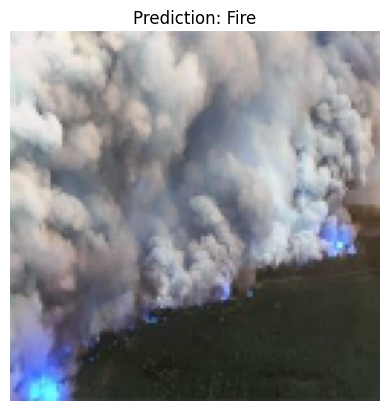

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc102.jpg
Prediction: 0.9996 (1 = Fire, 0 = Non-Fire)


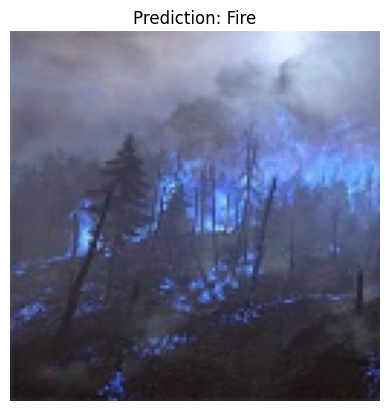

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/fire_0016.jpg
Prediction: 0.9998 (1 = Fire, 0 = Non-Fire)


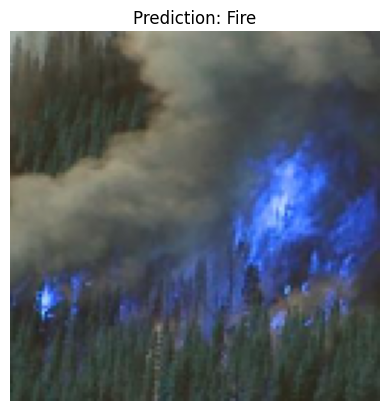

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc061.jpg
Prediction: 0.9998 (1 = Fire, 0 = Non-Fire)


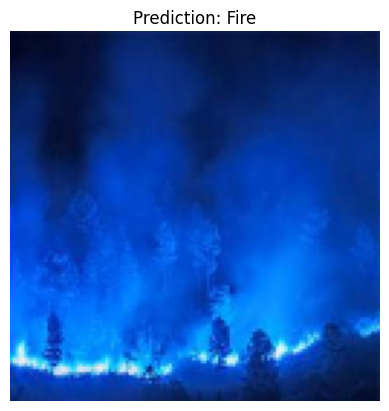

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc148.jpg
Prediction: 0.9995 (1 = Fire, 0 = Non-Fire)


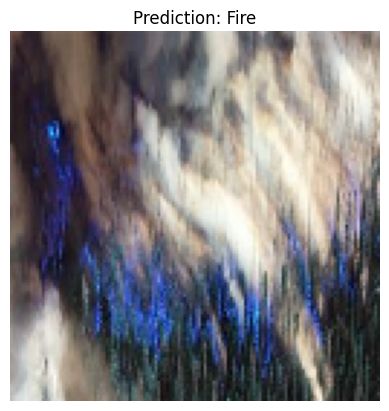

In [ ]:
sample_images, sample_paths = load_images(fire_Images[10:15])
preds = model.predict(sample_images)

# Display images with predictions
for i, img in enumerate(sample_images):
    print(f"Image: {sample_paths[i]}")
    print(f"Prediction: {preds[i][0]:.4f} (1 = Fire, 0 = Non-Fire)")
    plt.imshow(img)
    plt.title(f"Prediction: {'Fire' if preds[i][0] > 0.5 else 'Non-Fire'}")
    plt.axis('off')
    plt.show()

## Predict with NonFire Data

1/1 [==============================] - 1s 1s/step
Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc196.jpg
Prediction: 0.0001 (1 = Fire, 0 = Non-Fire)


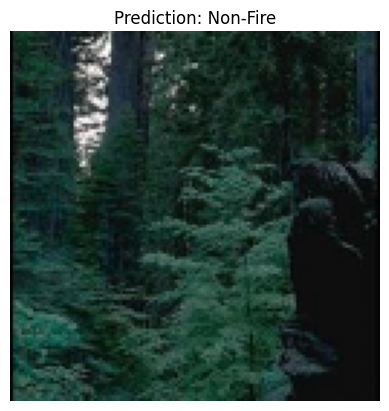

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc259.jpg
Prediction: 0.0003 (1 = Fire, 0 = Non-Fire)


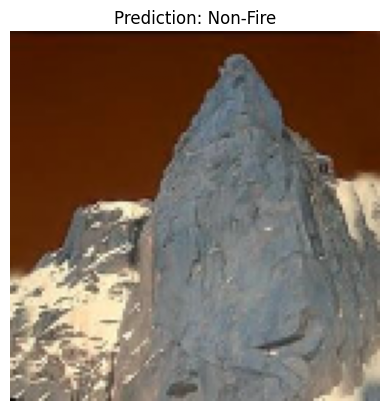

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc225.jpg
Prediction: 0.0035 (1 = Fire, 0 = Non-Fire)


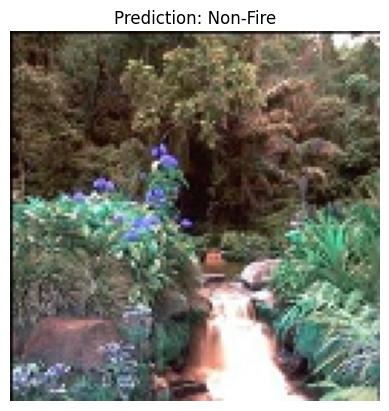

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc207.jpg
Prediction: 0.0103 (1 = Fire, 0 = Non-Fire)


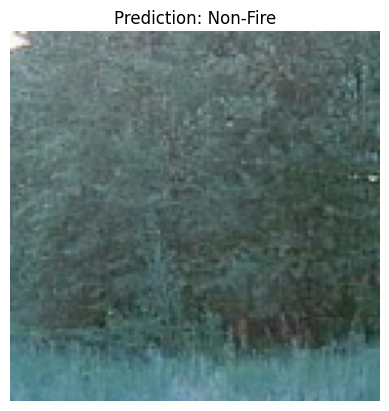

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc220.jpg
Prediction: 0.0039 (1 = Fire, 0 = Non-Fire)


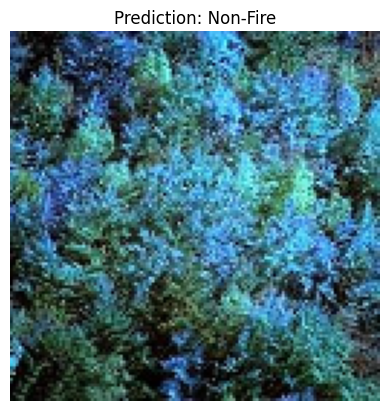

In [ ]:
sample_images, sample_paths = load_images(nonFire_Images[10:15])
preds = model.predict(sample_images)

# Display images with predictions
for i, img in enumerate(sample_images):
    print(f"Image: {sample_paths[i]}")
    print(f"Prediction: {preds[i][0]:.4f} (1 = Fire, 0 = Non-Fire)")
    plt.imshow(img)
    plt.title(f"Prediction: {'Fire' if preds[i][0] > 0.5 else 'Non-Fire'}")
    plt.axis('off')
    plt.show()

## Combined Fire & NonFire Data

1/1 [==============================] - 4s 4s/step
Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg
Prediction: 0.9991 (1 = Fire, 0 = Non-Fire)


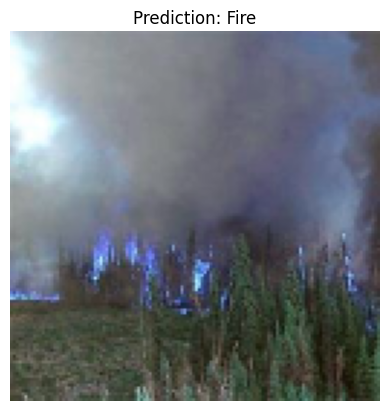

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg
Prediction: 0.9998 (1 = Fire, 0 = Non-Fire)


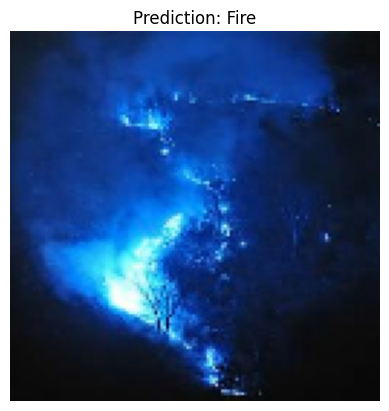

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg
Prediction: 0.9986 (1 = Fire, 0 = Non-Fire)


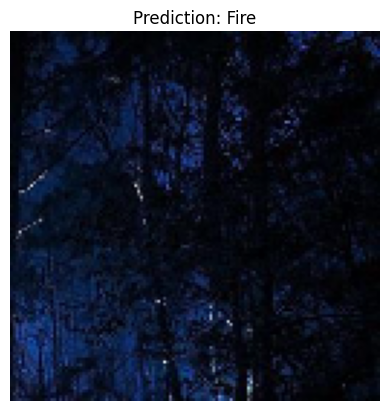

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg
Prediction: 0.9992 (1 = Fire, 0 = Non-Fire)


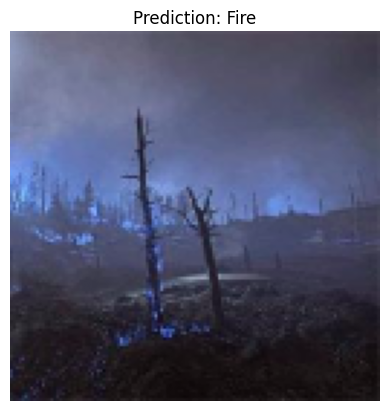

Image: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc027.jpg
Prediction: 0.9990 (1 = Fire, 0 = Non-Fire)


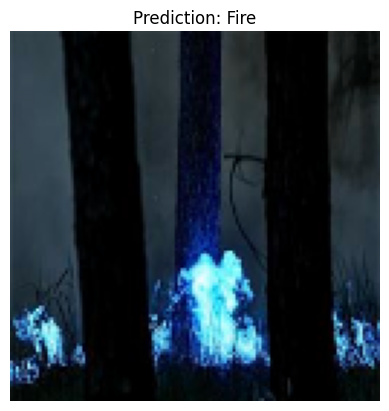

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc240.jpg
Prediction: 0.0027 (1 = Fire, 0 = Non-Fire)


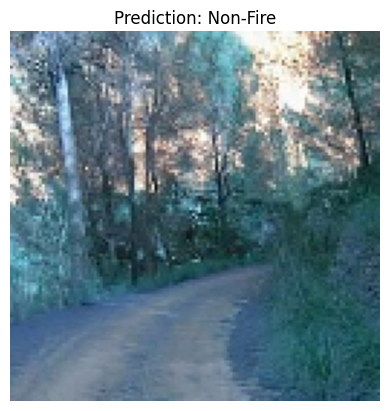

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc223.jpg
Prediction: 0.0014 (1 = Fire, 0 = Non-Fire)


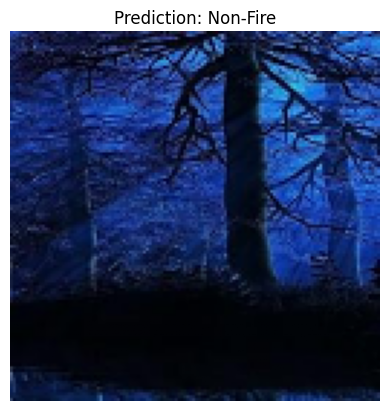

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc251.jpg
Prediction: 0.0002 (1 = Fire, 0 = Non-Fire)


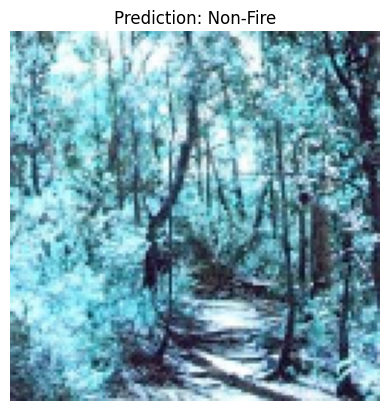

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc202.jpg
Prediction: 0.0007 (1 = Fire, 0 = Non-Fire)


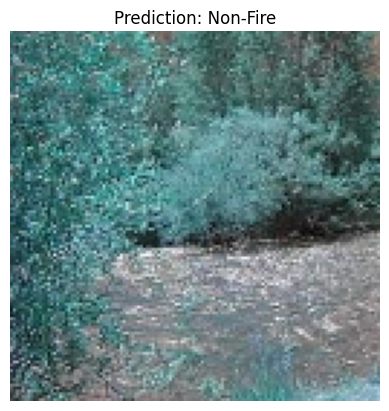

Image: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc206.jpg
Prediction: 0.0007 (1 = Fire, 0 = Non-Fire)


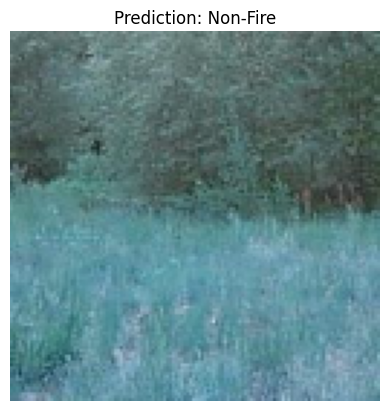

In [ ]:
combined = np.concatenate((fire_Images[:5], nonFire_Images[:5]), axis=0)

sample_images, sample_paths = load_images(combined)
preds = model.predict(sample_images)

for i, img in enumerate(sample_images):
    print(f"Image: {sample_paths[i]}")
    print(f"Prediction: {preds[i][0]:.4f} (1 = Fire, 0 = Non-Fire)")
    plt.imshow(img)
    plt.title(f"Prediction: {'Fire' if preds[i][0] > 0.5 else 'Non-Fire'}")
    plt.axis('off')
    plt.show()

1/1 [==============================] - 4s 4s/step


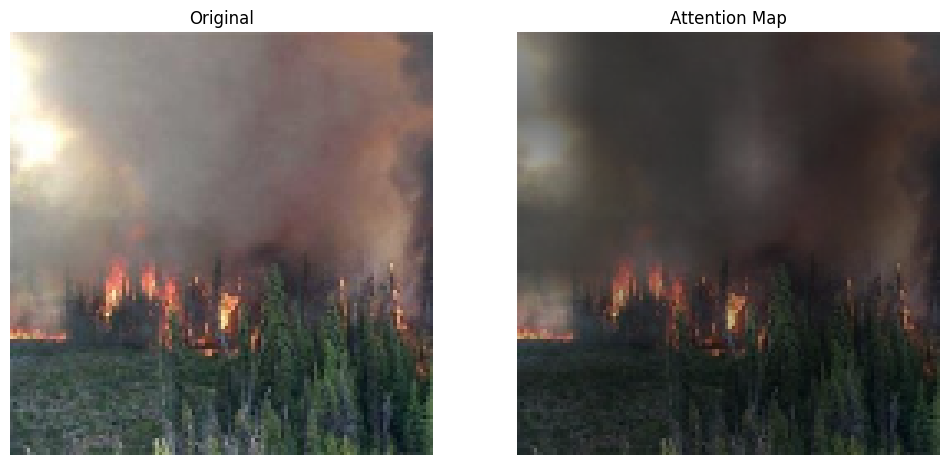

File: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc077.jpg | Predicted Class: Fire
1/1 [==============================] - 4s 4s/step


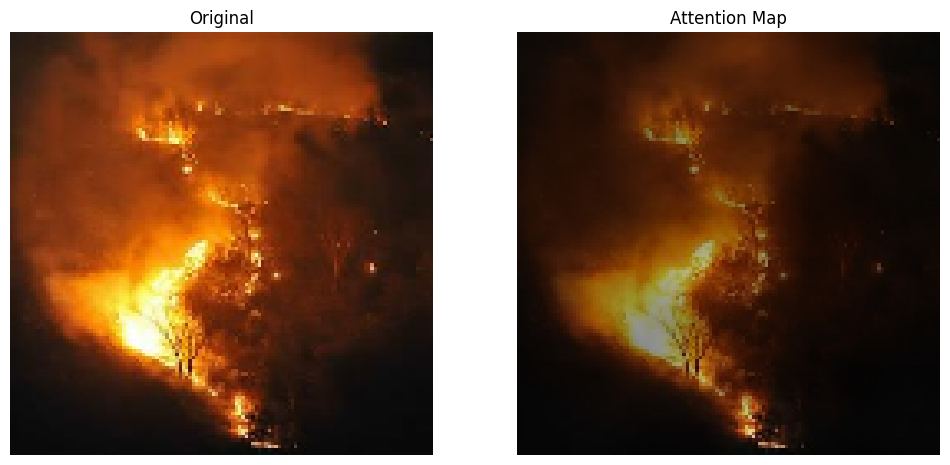

File: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc054.jpg | Predicted Class: Fire
1/1 [==============================] - 3s 3s/step


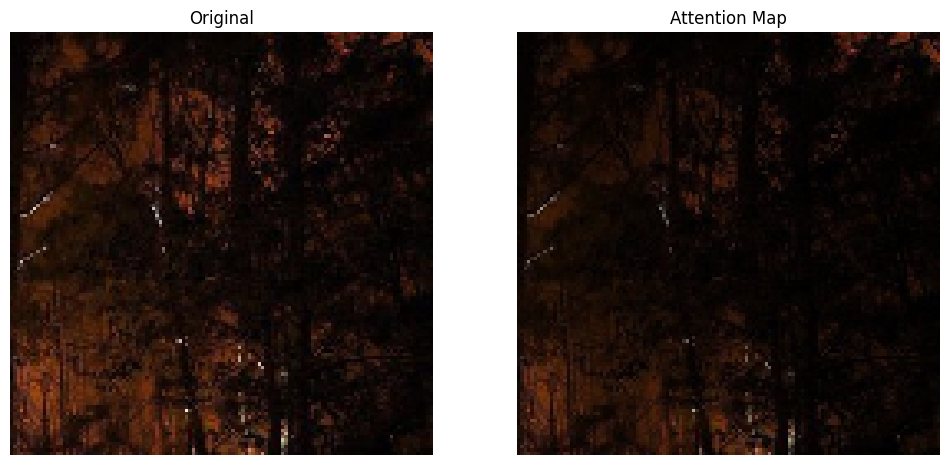

File: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc002.jpg | Predicted Class: Fire


1/1 [==============================] - 5s 5s/step


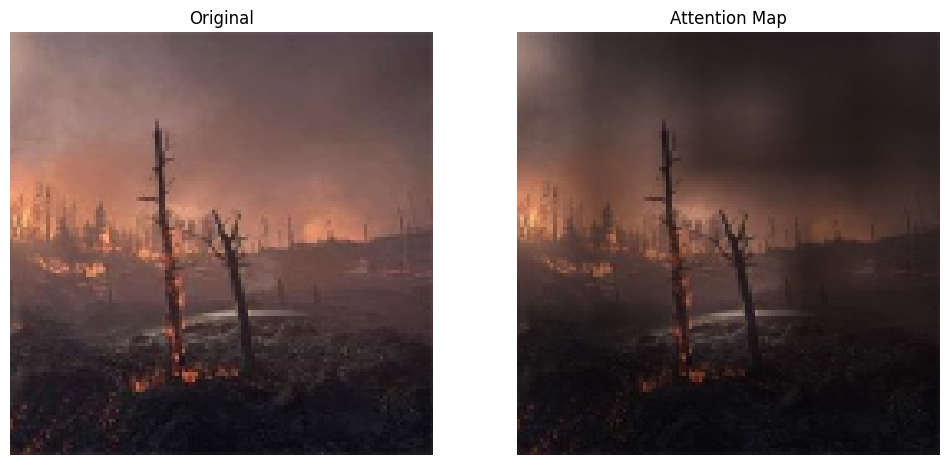

File: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc103.jpg | Predicted Class: Fire


1/1 [==============================] - 3s 3s/step


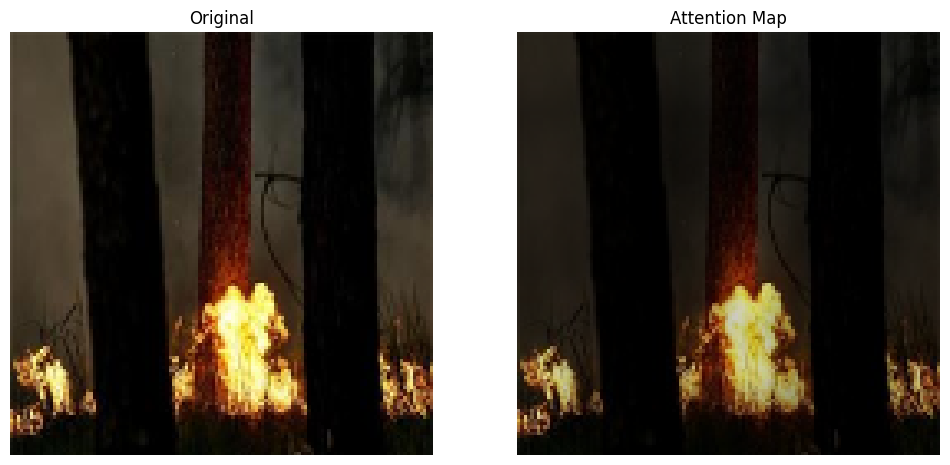

File: /content/drive/MyDrive/Forest_Fire_BigData/fire_images/abc027.jpg | Predicted Class: Fire
1/1 [==============================] - 3s 3s/step


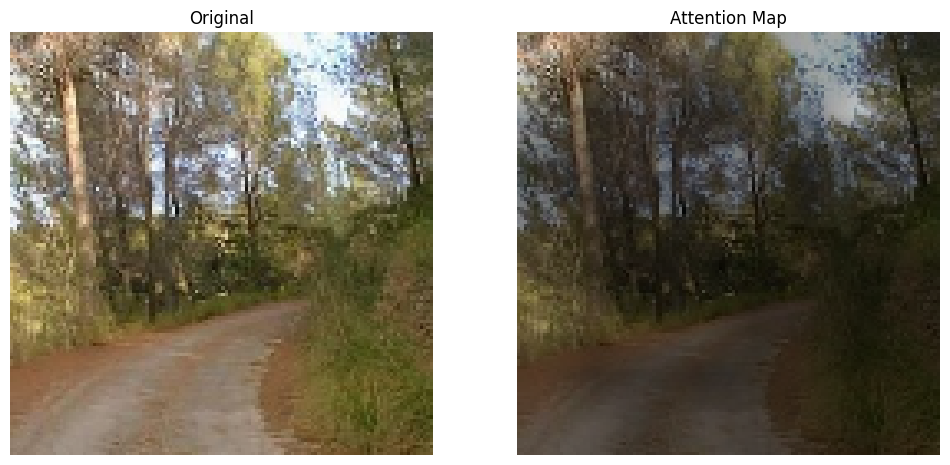

File: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc240.jpg | Predicted Class: Non-Fire
1/1 [==============================] - 4s 4s/step


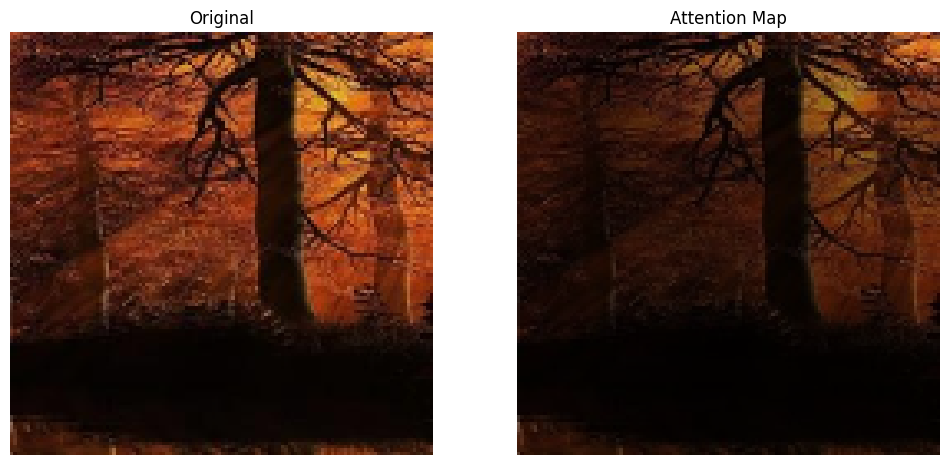

File: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc223.jpg | Predicted Class: Non-Fire
1/1 [==============================] - 5s 5s/step


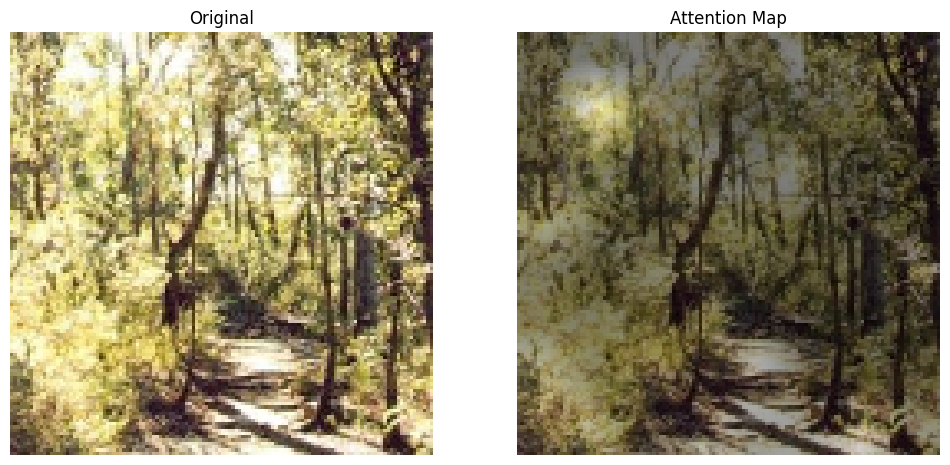

File: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc251.jpg | Predicted Class: Non-Fire
1/1 [==============================] - 4s 4s/step


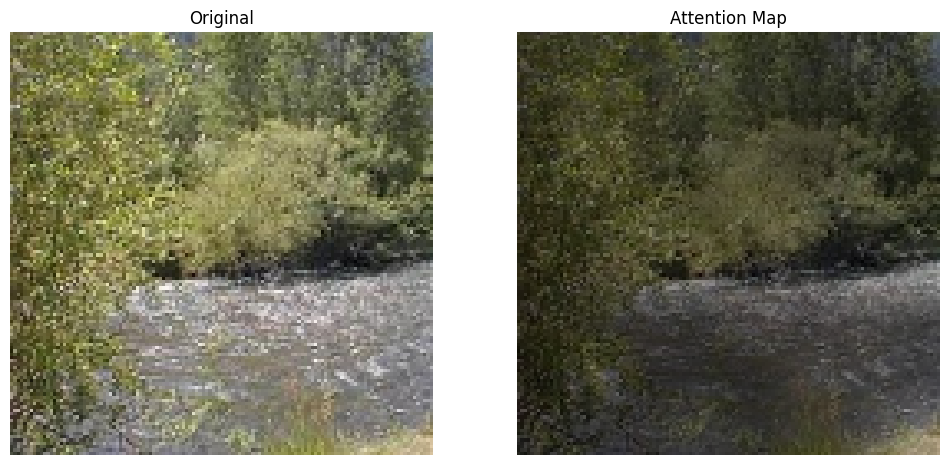

File: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc202.jpg | Predicted Class: Non-Fire
1/1 [==============================] - 4s 4s/step


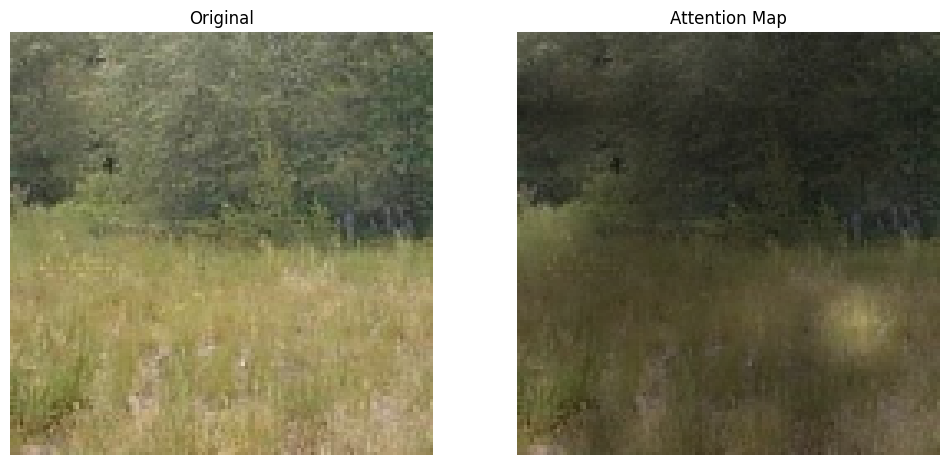

File: /content/drive/MyDrive/Forest_Fire_BigData/non_fire_images/abc206.jpg | Predicted Class: Non-Fire


In [ ]:
from vit_keras import vit, utils, visualize
import matplotlib.pyplot as plt
import numpy as np

image_size = 128

combined = np.concatenate((fire_Images[:5], nonFire_Images[:5]), axis=0)
sample_images, sample_paths = load_images(combined)
sample_images = sample_images.reshape(len(sample_images), image_size, image_size, 3)

preds = model.predict(sample_images)

classes = ['Fire', 'Non-Fire']

results = []
for i, pred in enumerate(preds):
    pred_class = classes[int(pred[0])]
    results.append({"filename": sample_paths[i], "predicted_class": 'Fire' if preds[i][0] > 0.5 else 'Non-Fire'})

for i in range(10):
    image = utils.read(sample_paths[i], image_size)
    image_resized = cv2.resize(image, (image_size, image_size))
    attention_map = visualize.attention_map(model=model, image=image_resized)

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 6))
    ax1.axis('off')
    ax2.axis('off')
    ax1.set_title('Original')
    ax2.set_title('Attention Map')

    ax1.imshow(image_resized)
    ax2.imshow(attention_map)

    plt.show()
    print(f"File: {sample_paths[i]} | Predicted Class: {results[i]['predicted_class']}")
